Connected to Python 3.8.10

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle
from probcs.datajoint.exc_tables import ExcExponentResult, ExcExponentConfig, schema

[2023-12-07 15:37:09,026][INFO]: Connecting sshrinivasan@134.76.19.44:3306
[2023-12-07 15:37:09,126][INFO]: Connected sshrinivasan@134.76.19.44:3306


In [2]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim, 2, dpi=300, tight_layout=True, sharex="col"
    )
    legend_size = 6
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="orange",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )


        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="orange",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="orange",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="orange",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

In [3]:
results = ExcExponentConfig() * ExcExponentResult()

In [4]:
key_results = results.fetch(
    "config_id",
    "average_exc",
    "average_inh_1",
    "average_inh_2",
    order_by="average_inh_1",
    as_dict=True,
)

In [5]:
highest_inh_1_config_id = key_results[0]["config_id"]
# '32645fb5a995f73c4aba131b1c598425'

In [6]:
highest_inh_1_results = (results & {"config_id": highest_inh_1_config_id}).fetch(
    download_path="/tmp", as_dict=True
)

In [7]:
with open(highest_inh_1_results[0]["all_idata"], "rb") as f:
    all_idata = pickle.load(f)

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


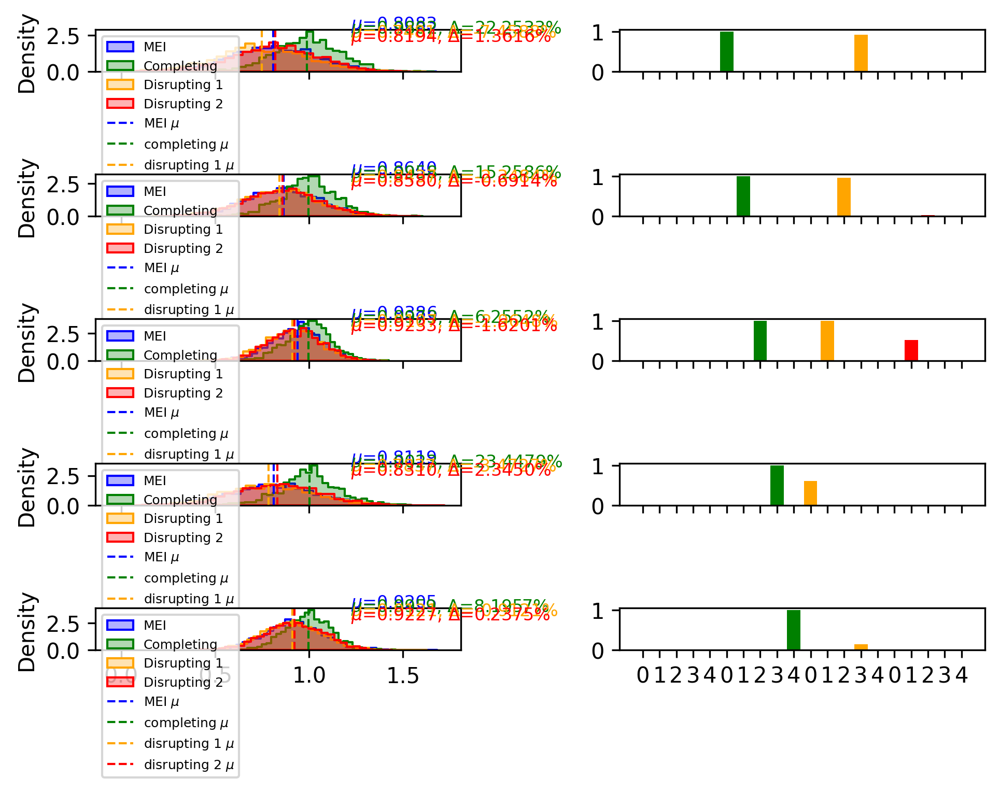

In [8]:
g_dim = highest_inh_1_results[0]["g_dim"]
disrupting_pattern_indices = highest_inh_1_results[0]["disrupting_pattern_indices"]

(
    fig,
    axs,
    completing_perc_diff_list,
    disrupting_1_perc_diff_list,
    disrupting_2_perc_diff_list,
) = plot_posterior_half(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [9]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim, 2, figsize=(2 * 10, G_dim *10), tight_layout=True, sharex="col"
    )
    legend_size = 6
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="orange",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )


        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="orange",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="orange",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="orange",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


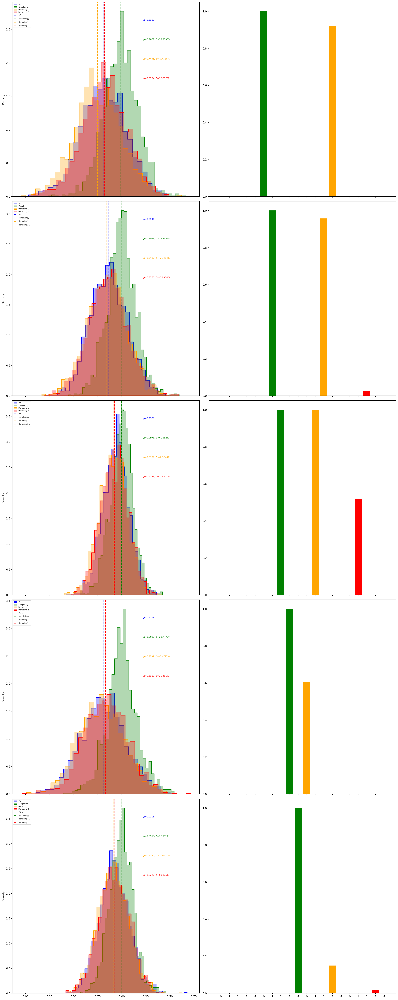

In [10]:
g_dim = highest_inh_1_results[0]["g_dim"]
disrupting_pattern_indices = highest_inh_1_results[0]["disrupting_pattern_indices"]

(
    fig,
    axs,
    completing_perc_diff_list,
    disrupting_1_perc_diff_list,
    disrupting_2_perc_diff_list,
) = plot_posterior_half(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [11]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim, 2, figsize=(2 * 5, G_dim *5), tight_layout=True, sharex="col"
    )
    legend_size = 6
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="orange",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )


        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="orange",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="orange",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="orange",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


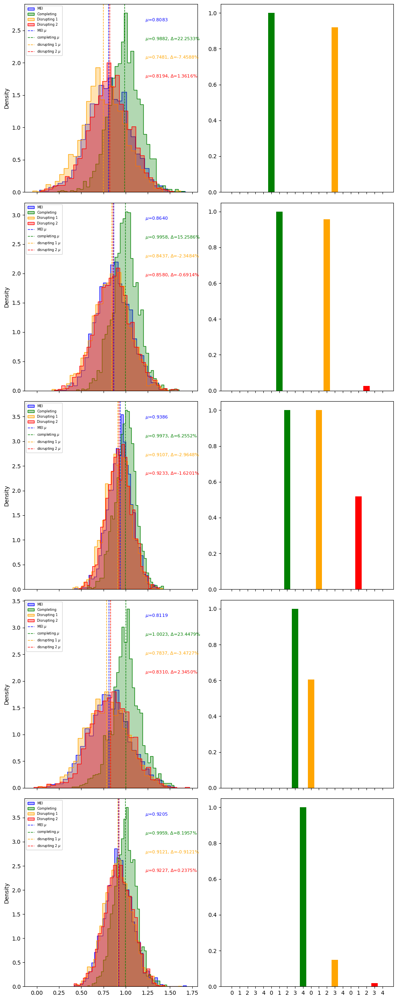

In [12]:
g_dim = highest_inh_1_results[0]["g_dim"]
disrupting_pattern_indices = highest_inh_1_results[0]["disrupting_pattern_indices"]

(
    fig,
    axs,
    completing_perc_diff_list,
    disrupting_1_perc_diff_list,
    disrupting_2_perc_diff_list,
) = plot_posterior_half(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [13]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim, 2, figsize=(2 * 2, G_dim *2), tight_layout=True, sharex="col"
    )
    legend_size = 6
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="orange",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )


        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="orange",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="orange",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="orange",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


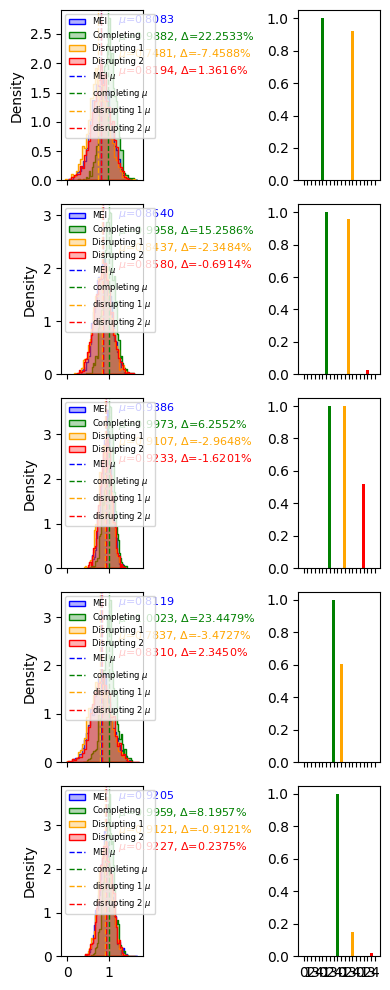

In [14]:
g_dim = highest_inh_1_results[0]["g_dim"]
disrupting_pattern_indices = highest_inh_1_results[0]["disrupting_pattern_indices"]

(
    fig,
    axs,
    completing_perc_diff_list,
    disrupting_1_perc_diff_list,
    disrupting_2_perc_diff_list,
) = plot_posterior_half(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [15]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim, 2, figsize=((2 + 3) * 2, (G_dim + 3) *2), tight_layout=True, sharex="col"
    )
    legend_size = 6
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="orange",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )


        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="orange",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="orange",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="orange",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


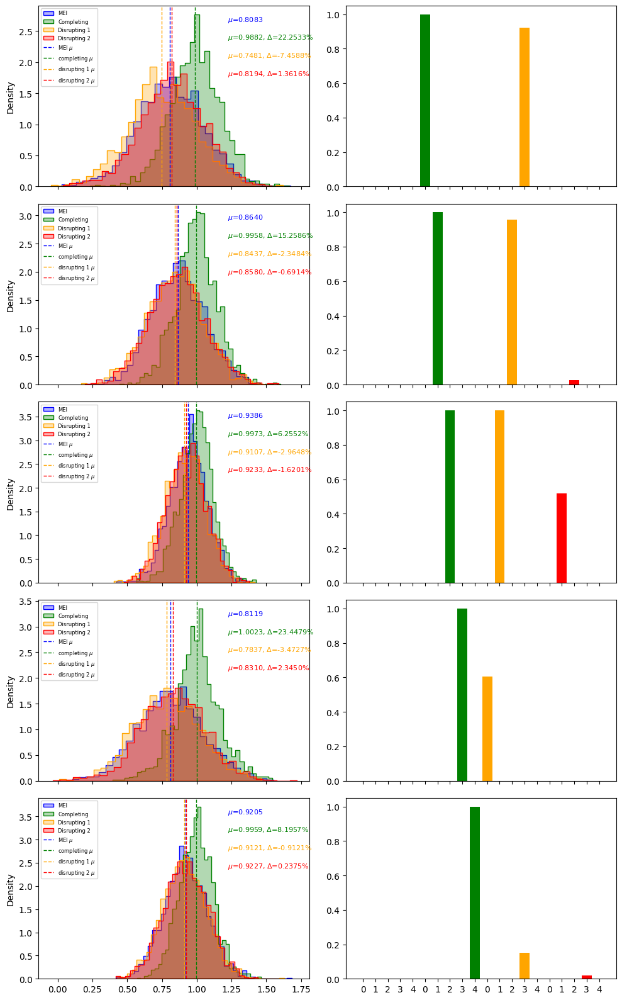

In [16]:
g_dim = highest_inh_1_results[0]["g_dim"]
disrupting_pattern_indices = highest_inh_1_results[0]["disrupting_pattern_indices"]

(
    fig,
    axs,
    completing_perc_diff_list,
    disrupting_1_perc_diff_list,
    disrupting_2_perc_diff_list,
) = plot_posterior_half(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [17]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim, 2, figsize=((2 + 3) * 2, (G_dim + 3) *2), tight_layout=True, sharex="col"
    )
    legend_size = 10
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="brown",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )


        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="brown",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="brown",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="brown",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

In [18]:
# from probcs.utils.plotting import plot_posterior, plot_samples_relative_mei

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


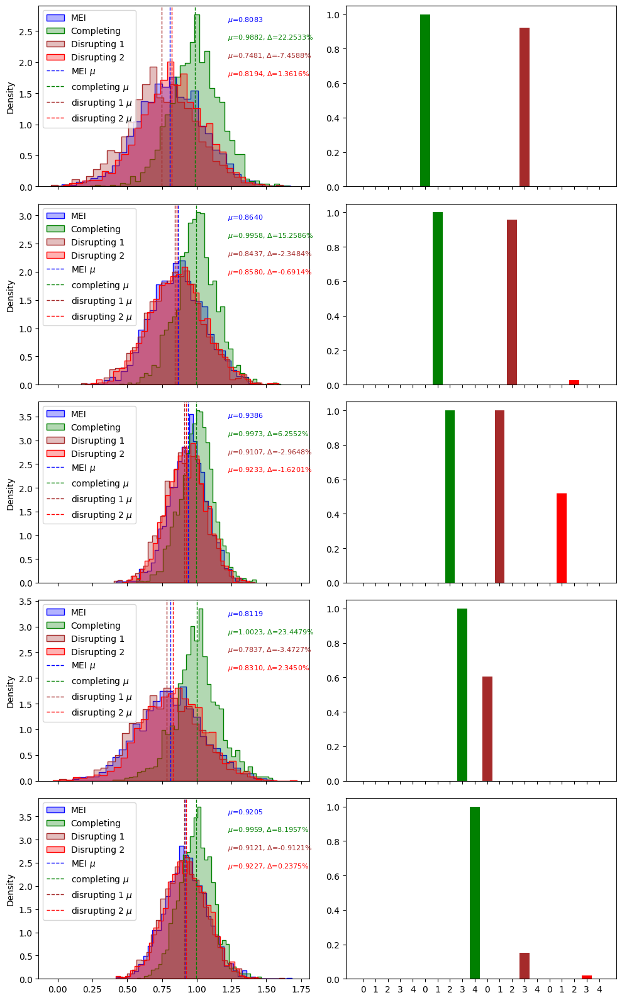

In [19]:
g_dim = highest_inh_1_results[0]["g_dim"]
disrupting_pattern_indices = highest_inh_1_results[0]["disrupting_pattern_indices"]

(
    fig,
    axs,
    completing_perc_diff_list,
    disrupting_1_perc_diff_list,
    disrupting_2_perc_diff_list,
) = plot_posterior_half(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [20]:
disrupting_pattern_indices

[3, 2, 1, 0, 3]

In [21]:
fig_samples, axs_samples = plot_samples_relative_mei(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.3, 1.4),
    xticks=[0.3, 1.4],
)

NameError: name 'plot_samples_relative_mei' is not defined

In [22]:
def plot_samples_relative_mei(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to completing pattern", fontsize=8)
        axs[1].set_ylabel("Response to disrupting 1 pattern", fontsize=8)
        axs[2].set_ylabel("Response to disrupting 2 pattern", fontsize=8)

    return fig, axs

In [23]:
def plot_samples_relative_mei(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True, tight_layout=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to completing pattern", fontsize=8)
        axs[1].set_ylabel("Response to disrupting 1 pattern", fontsize=8)
        axs[2].set_ylabel("Response to disrupting 2 pattern", fontsize=8)

    return fig, axs

In [24]:
def plot_samples_relative_mei_local(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True, tight_layout=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to completing pattern", fontsize=8)
        axs[1].set_ylabel("Response to disrupting 1 pattern", fontsize=8)
        axs[2].set_ylabel("Response to disrupting 2 pattern", fontsize=8)

    return fig, axs

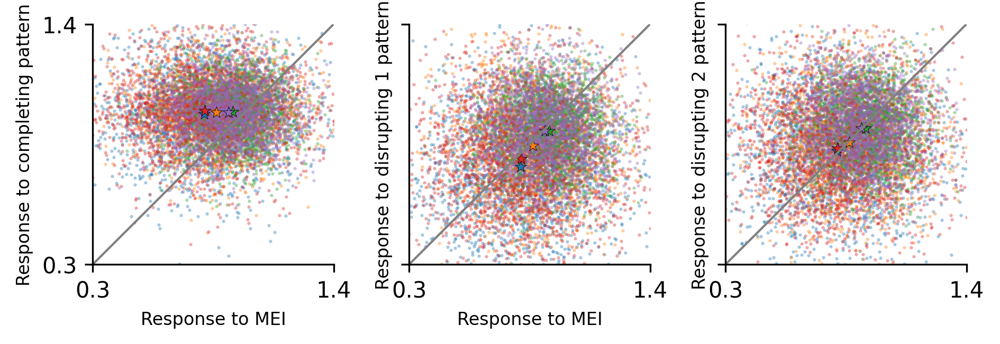

In [25]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.3, 1.4),
    xticks=[0.3, 1.4],
)

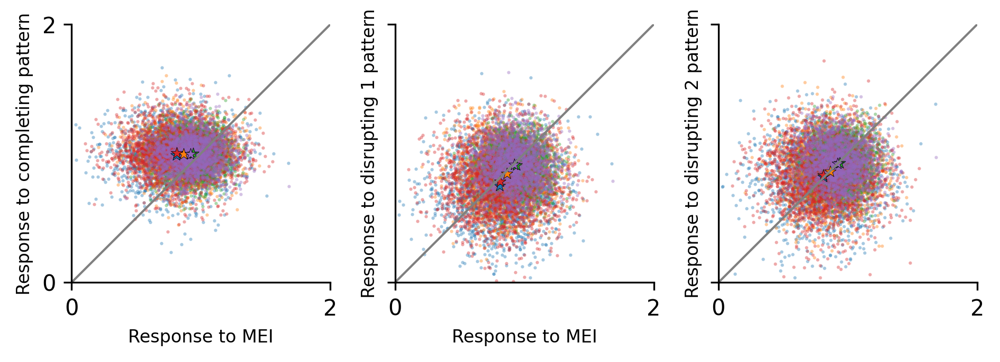

In [26]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0, 2),
    xticks=[0, 2],
)

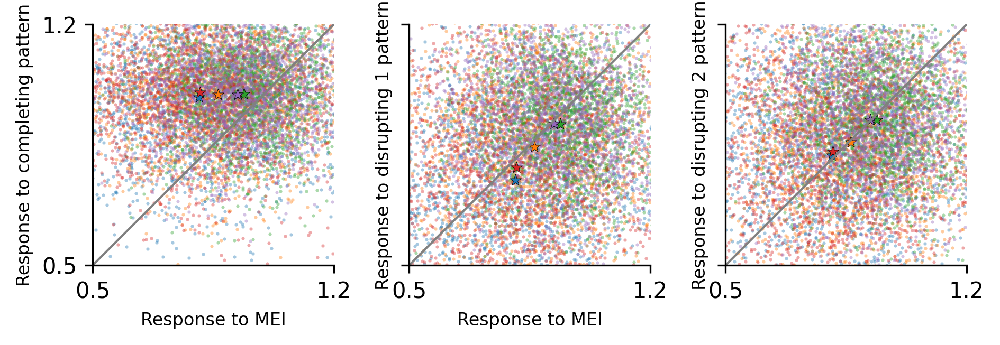

In [27]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.5, 1.2),
    xticks=[0.5, 1.2],
)

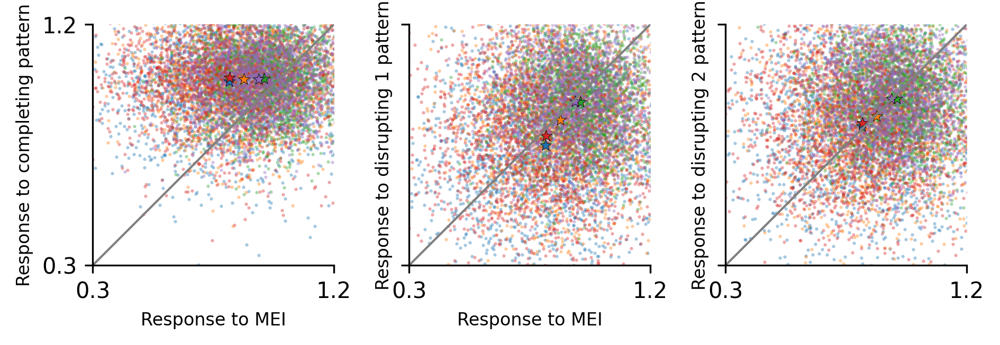

In [28]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.3, 1.2),
    xticks=[0.3, 1.2],
)

In [29]:
def plot_samples_relative_mei_local(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True, tight_layout=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.2,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.2,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to completing pattern", fontsize=8)
        axs[1].set_ylabel("Response to disrupting 1 pattern", fontsize=8)
        axs[2].set_ylabel("Response to disrupting 2 pattern", fontsize=8)

    return fig, axs

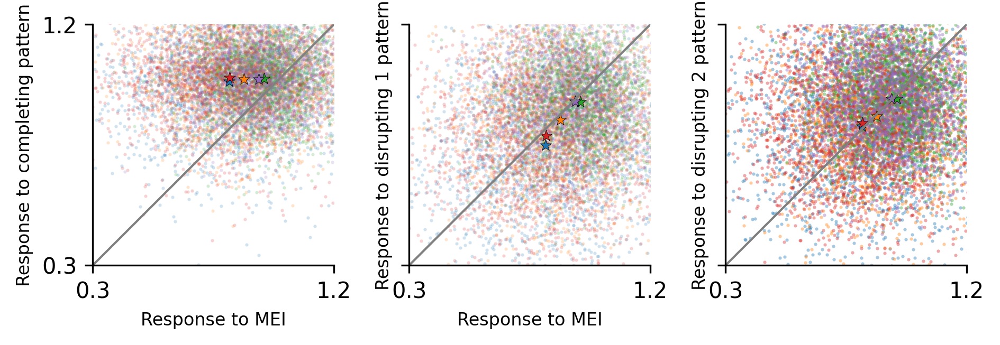

In [30]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.3, 1.2),
    xticks=[0.3, 1.2],
)

In [31]:
def plot_samples_relative_mei_local(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True, tight_layout=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.1,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.1,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.1,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to completing pattern", fontsize=8)
        axs[1].set_ylabel("Response to disrupting 1 pattern", fontsize=8)
        axs[2].set_ylabel("Response to disrupting 2 pattern", fontsize=8)

    return fig, axs

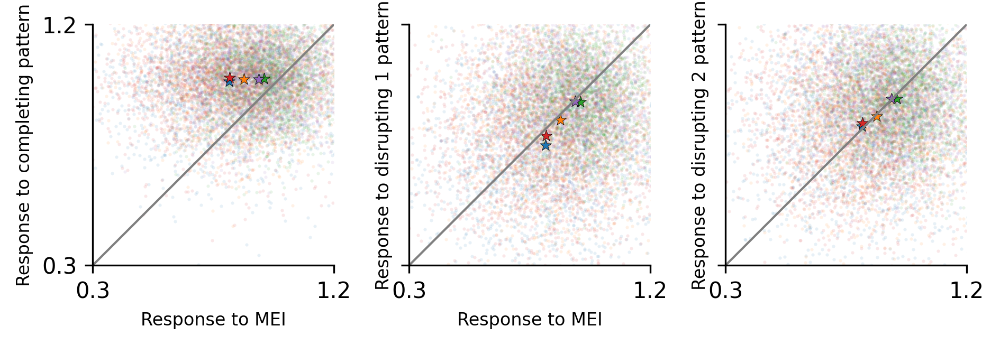

In [32]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.3, 1.2),
    xticks=[0.3, 1.2],
)

In [33]:
def plot_samples_relative_mei_local(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True, tight_layout=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.1,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.1,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.1,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)
        axs[2].set_xlabel("Response to MEI", fontsize=8)
        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to CI", fontsize=8)
        axs[1].set_ylabel("Response to DI1", fontsize=8)
        axs[2].set_ylabel("Response to DI2", fontsize=8)

    return fig, axs

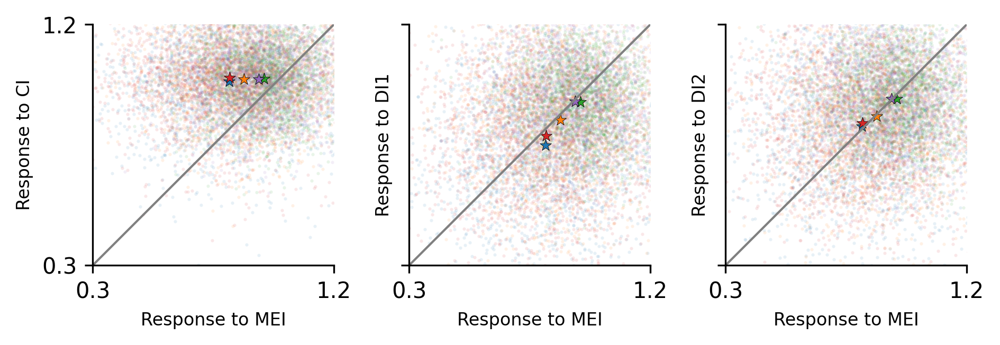

In [34]:
fig_samples, axs_samples = plot_samples_relative_mei_local(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
    xlim=(0.3, 1.2),
    xticks=[0.3, 1.2],
)

In [35]:
from probcs.utils.plotting import plot_posterior

In [36]:
plot_result = plot_posterior(

SyntaxError: unexpected EOF while parsing (<ipython-input-36-48e379a3cbb6>, line 2)

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


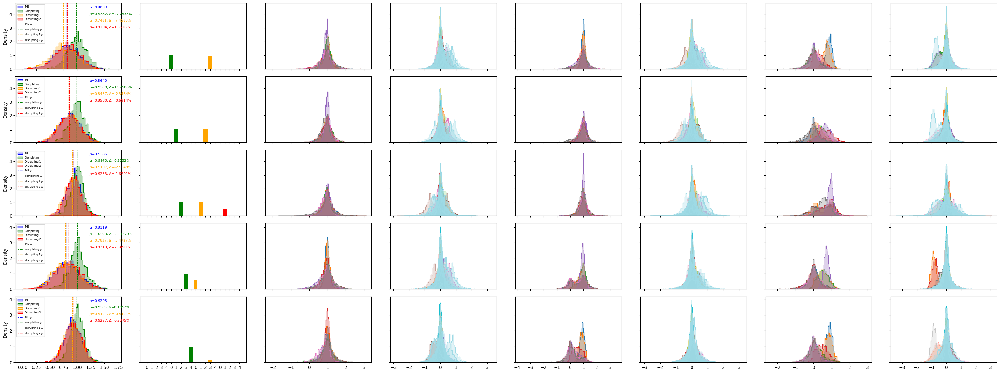

In [37]:
plot_result = plot_posterior(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


KeyError: 0

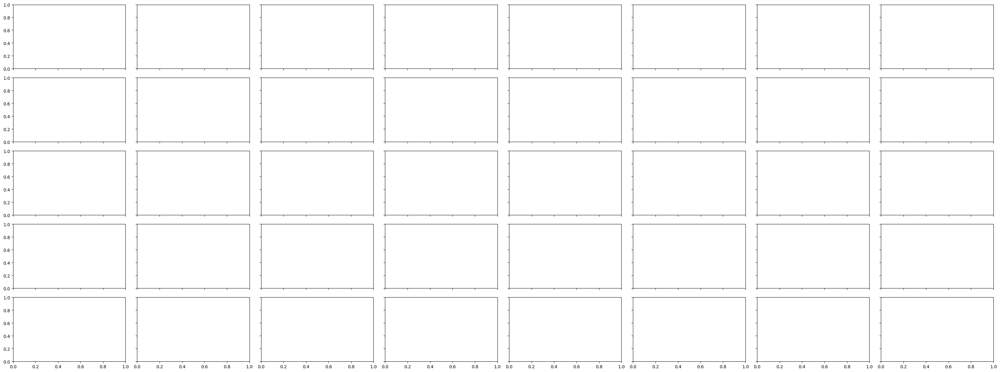

In [38]:
plot_result = plot_posterior(
    all_idata=all_idata[0],
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [39]:
len(all_idata)

5

In [40]:
all_data

NameError: name 'all_data' is not defined

In [41]:
all_idata

[[Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data],
 [Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data],
 [Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_data
  	> constant_data,
  Inference data with groups:
  	> posterior
  	> sample_stats
  	> observed_dat

In [42]:
all_idata[0]

[Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data]

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


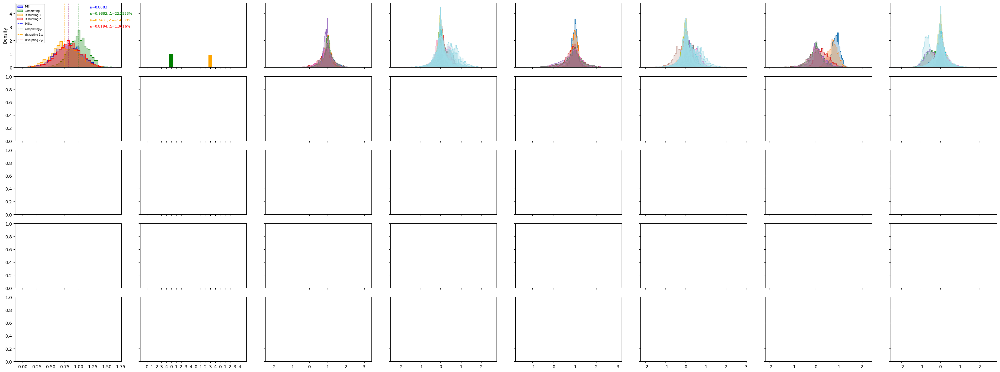

In [43]:
plot_result = plot_posterior(
    all_idata=[all_idata[0]],
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

[0, 1, 2]


TypeError: 'Axes' object is not subscriptable

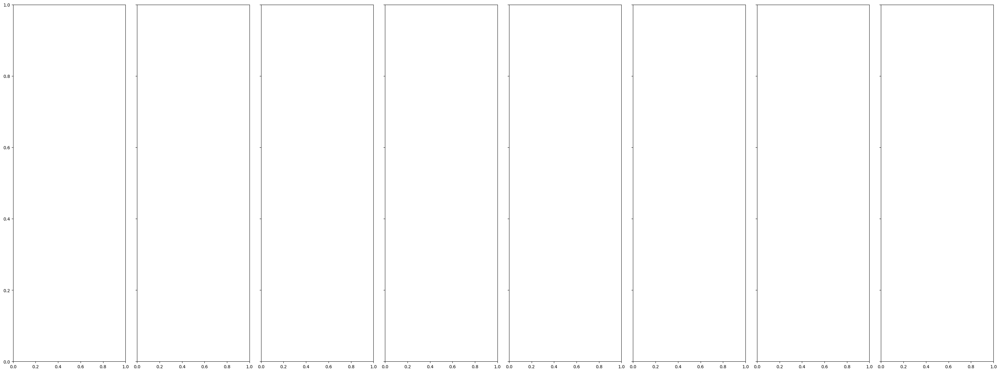

In [44]:
plot_result = plot_posterior(
    all_idata=[all_idata[0]],
    disrupting_pattern_indices=[disrupting_pattern_indices[0]],
    G_dim=1,
)

In [45]:
plot_result = plot_posterior(
    all_idata=all_idata[[0, 1]],
    disrupting_pattern_indices=disrupting_pattern_indices[[0, 1]],
    G_dim=2,
)

TypeError: list indices must be integers or slices, not list

[0, 1, 2, 4, 6, 9, 10, 12, 14, 16]


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (2,) and arg 1 with shape (5,).

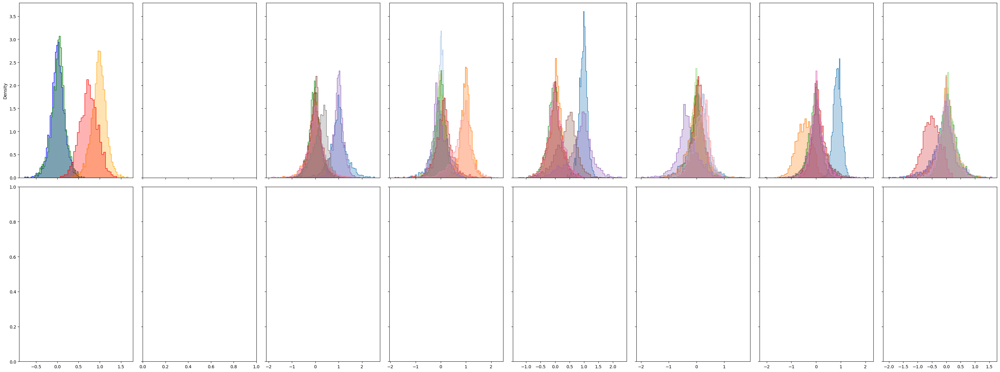

In [46]:
plot_result = plot_posterior(
    all_idata=all_idata[:2],
    disrupting_pattern_indices=disrupting_pattern_indices[:2],
    G_dim=2,
)

In [ ]:
plot_result = plot_posterior(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

: 

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


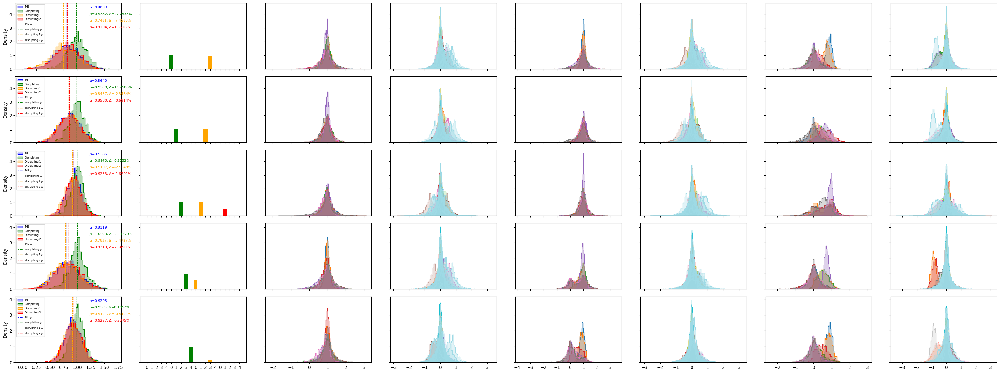

In [47]:
plot_result = plot_posterior(
    all_idata=all_idata,
    disrupting_pattern_indices=disrupting_pattern_indices,
    G_dim=g_dim,
)

In [48]:
all_idata[0]

[Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data]

[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]
[0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44]
[0, 2, 3, 4, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 42, 43, 44]
[1, 2, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44]
[0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 39, 40, 41, 42, 44]


/usr/local/lib/python3.8/dist-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  func(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


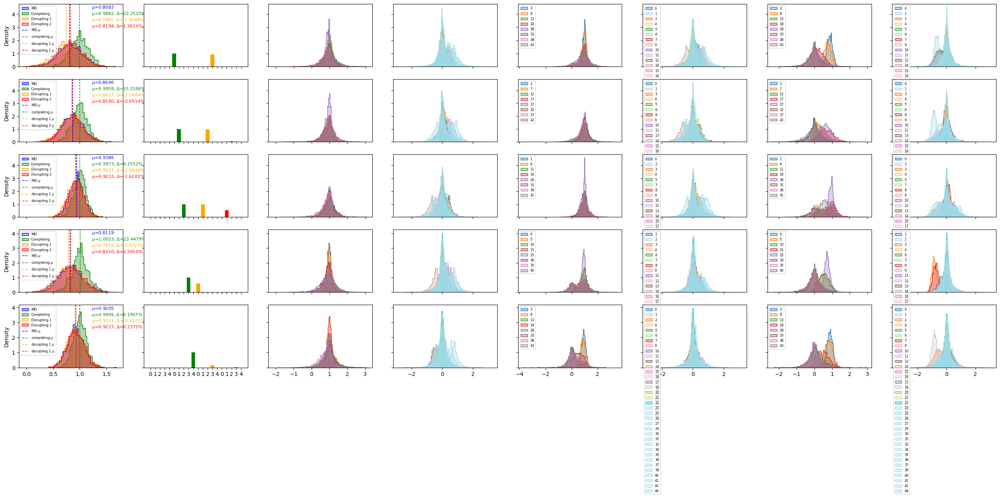

In [49]:
fig, axs = plt.subplots(g_dim, 8, figsize=(8*4, 3*4), tight_layout=True, sharex='col', sharey='row')
legend_size = 6
possible_center_x_ids = [4 * g_dim + i for i in range(g_dim)]
for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(zip(axs, all_idata, disrupting_pattern_indices)):
    center_x_id = 4 * g_dim + idx
    # i for i in range(idx, g_dim)
    completing_surround_x_ids = [i for i in range(idx, 9*g_dim, g_dim) if i != center_x_id]
    # complement of completing_surround_x_ids
    not_completing_surround_x_ids = [i for i in range(9 * g_dim) if (i not in completing_surround_x_ids) and (i != center_x_id)]
    disrupting_surround_x_ids = [i for i in range(disrupting_pattern_idx, 9*g_dim, g_dim) if i not in possible_center_x_ids]
    # complement of disrupting_surround_x_ids
    not_disrupting_surround_x_ids = [i for i in range(9 * g_dim) if (i not in disrupting_surround_x_ids) and (i != center_x_id)]
    print(not_disrupting_surround_x_ids)
    
    # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
    mei_idata = idata_set[0]
    completing_idata = idata_set[1]
    disrupting_1_idata = idata_set[2]
    disrupting_2_idata = idata_set[3]

    mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
    mei_x_mean = mei_x_samples.mean()
    sns.histplot(
        mei_x_samples,
        ax=ax_set[0],
        stat="density",
        color="blue",
        element="step",
        alpha=0.3,
        label="MEI"
    )

    # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_g_dims)
    mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
    # mei_g_samples.shape = (n_g_dims,)

    colors = plt.cm.tab10(range(len(completing_surround_x_ids)))
    for completing_surround_index, completing_surround_x_id in enumerate(completing_surround_x_ids):
        completing_surround_x_samples = completing_idata["posterior"]["X"].data[:, :, completing_surround_x_id].flatten()
        sns.histplot(
            completing_surround_x_samples,
            ax=ax_set[2],
            stat="density",
            color=colors[completing_surround_index],
            element="step",
            alpha=0.3,
            label=f"{completing_surround_x_id}"
        )
        # ax_set[2].legend(prop={'size': legend_size}, loc="upper left")


    colors = plt.cm.tab20(range(len(not_completing_surround_x_ids)))
    for not_completing_surround_index, not_completing_surround_x_id in enumerate(not_completing_surround_x_ids):
        not_completing_surround_x_samples = completing_idata["posterior"]["X"].data[:, :, not_completing_surround_x_id].flatten()
        sns.histplot(
            not_completing_surround_x_samples,
            ax=ax_set[3],
            stat="density",
            color=colors[not_completing_surround_index],
            element="step",
            alpha=0.3,
            label=f"{not_completing_surround_x_id}"
        )
        # ax_set[3].legend(prop={'size': legend_size}, loc="upper left")


    completing_x_samples = completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
    completing_x_mean = completing_x_samples.mean()
    completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
    sns.histplot(
        completing_x_samples,
        ax=ax_set[0],
        stat="density",
        color="green",
        element="step",
        alpha=0.3,
        label="Completing"
    )

    completing_g_samples = completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)

    disrupting_1_x_samples = disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
    disrupting_1_x_mean = disrupting_1_x_samples.mean()
    disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
    sns.histplot(
        disrupting_1_x_samples,
        ax=ax_set[0],
        stat="density",
        color="orange",
        element="step",
        alpha=0.3,
        label="Disrupting 1"
    )

    disrupting_1_g_samples = disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)

    disrupting_2_x_samples = disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
    disrupting_2_x_mean = disrupting_2_x_samples.mean()
    disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
    sns.histplot(
        disrupting_2_x_samples,
        ax=ax_set[0],
        stat="density",
        color="red",
        element="step",
        alpha=0.3,
        label="Disrupting 2"
    )

    disrupting_2_g_samples = disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)


    colors = plt.cm.tab10(range(len(disrupting_surround_x_ids)))
    for disrupting_surround_index, disrupting_surround_x_id in enumerate(disrupting_surround_x_ids):
        disrupting_1_surround_x_samples = disrupting_1_idata["posterior"]["X"].data[:, :, disrupting_surround_x_id].flatten()
        sns.histplot(
            disrupting_1_surround_x_samples,
            ax=ax_set[4],
            stat="density",
            color=colors[disrupting_surround_index],
            element="step",
            alpha=0.3,
            label=f"{disrupting_surround_x_id}"
        )
        ax_set[4].legend(prop={'size': legend_size}, loc="upper left")
        disrupting_2_surround_x_samples = disrupting_2_idata["posterior"]["X"].data[:, :, disrupting_surround_x_id].flatten()
        sns.histplot(
            disrupting_2_surround_x_samples,
            ax=ax_set[6],
            stat="density",
            color=colors[disrupting_surround_index],
            element="step",
            alpha=0.3,
            label=f"{disrupting_surround_x_id}"
        )
        ax_set[6].legend(prop={'size': legend_size}, loc="upper left")

    colors = plt.cm.tab20(range(len(not_disrupting_surround_x_ids)))
    for not_disrupting_surround_index, not_disrupting_surround_x_id in enumerate(not_disrupting_surround_x_ids):
        not_disrupting_1_surround_x_samples = disrupting_1_idata["posterior"]["X"].data[:, :, not_disrupting_surround_x_id].flatten()
        sns.histplot(
            not_disrupting_1_surround_x_samples,
            ax=ax_set[5],
            stat="density",
            color=colors[not_disrupting_surround_index],
            element="step",
            alpha=0.3,
            label=f"{not_disrupting_surround_x_id}"
        )
        ax_set[5].legend(prop={'size': legend_size}, loc="upper left")
        not_disrupting_2_surround_x_samples = disrupting_2_idata["posterior"]["X"].data[:, :, not_disrupting_surround_x_id].flatten()
        sns.histplot(
            not_disrupting_2_surround_x_samples,
            ax=ax_set[7],
            stat="density",
            color=colors[not_disrupting_surround_index],
            element="step",
            alpha=0.3,
            label=f"{not_disrupting_surround_x_id}"
        )
        ax_set[7].legend(prop={'size': legend_size}, loc="upper left")


    ax_set[1].bar(
    x=np.arange(g_dim),
    height=mei_g_samples,
    width=.8,
    color="blue"
    )
    ax_set[1].bar(
        x=np.arange(g_dim) + g_dim,
        height=completing_g_samples,
        width=.8,
        color="green"
    )
    ax_set[1].bar(
        x=np.arange(g_dim) + g_dim*2,
        height=disrupting_1_g_samples,
        width=.8,
        color="orange"
    )
    ax_set[1].bar(
        x=np.arange(g_dim) + g_dim*3,
        height=disrupting_2_g_samples,
        width=.8,
        color="red"
    )
    ax_set[1].set_xticks(np.arange(g_dim*4))
    ax_set[1].set_xticklabels(list(np.arange(g_dim))*4)

    ax_set[0].text(0.7, 0.9, f"$\mu$={mei_x_mean:.4f}", size=8, ha="left", va="bottom", transform=ax_set[0].transAxes, color='blue')
    ax_set[0].text(0.7, 0.8, f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%", size=8, ha="left", va="bottom", transform=ax_set[0].transAxes, color='green')
    ax_set[0].text(0.7, 0.7, f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%", size=8, ha="left", va="bottom", transform=ax_set[0].transAxes, color='orange')
    ax_set[0].text(0.7, 0.6, f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%", size=8, ha="left", va="bottom", transform=ax_set[0].transAxes, color='red')

    ax_set[0].axvline(mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$")
    ax_set[0].axvline(completing_x_mean, color="green", linestyle="--", linewidth=1, label="completing $\mu$")
    ax_set[0].axvline(disrupting_1_x_mean, color="orange", linestyle="--", linewidth=1, label="disrupting 1 $\mu$")
    ax_set[0].axvline(disrupting_2_x_mean, color="red", linestyle="--", linewidth=1, label="disrupting 2 $\mu$")
    ax_set[0].legend(prop={'size': legend_size}, loc="upper left")

In [50]:
all_idata[0]

[Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data,
 Inference data with groups:
 	> posterior
 	> sample_stats
 	> observed_data
 	> constant_data]

In [51]:
all_idata[0]["posterior"]["G"]

TypeError: list indices must be integers or slices, not str

In [52]:
all_idata[0][0]["posterior"]["G"]

<xarray.DataArray 'G' (chain: 4, draw: 500, G_dim_0: 5)>
array([[[0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        ...,
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0]],

       [[0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        ...,
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0]],

       [[0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        ...,
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0]],

       [[0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        ...,
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0]]])
Coordinates:
  * chain    (chain) int64 0 1 2 3
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 492 493 494 495 496 497 498 499
  * G_dim_0  (G_dim_0) int64 0 1 2 3 4

In [53]:
all_idata[0][0]["posterior"]["G"].data.shape

(4, 500, 5)

In [54]:
all_idata[0][0]["posterior"]["G"].data.sum(axis=1)

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]])

In [55]:
disrupting_pattern_indices

[3, 2, 1, 0, 3]

In [56]:
all_idata[0][2]["posterior"]["X"].data.shape

(4, 500, 45)

In [57]:
all_idata[0][2]["posterior"]["X"].data[:, :, 23].mean()

0.22368580602998758

In [58]:
all_idata[0][2]["posterior"]["X"].data[:, :, 22].mean()

-0.04231445131220336

In [59]:
all_idata[0][2]["posterior"]["X"].data[:, :, 21].mean()

-0.05038884988828352

In [60]:
all_idata[0][2]["posterior"]["X"].data[:, :, 20].mean()

0.748054906409715

In [61]:
all_idata[0][2]["posterior"]["X"].data[:, :, 24].mean()

-0.03721408566137347

In [62]:
all_idata[0][2]["posterior"]["X"].data[:, :, 23].mean()

0.22368580602998758

Connected to Python 3.8.10

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle
from probcs.datajoint.exc_tables import ExcExponentResult, ExcExponentConfig, schema

[2024-01-17 09:38:45,249][INFO]: Connecting sshrinivasan@134.76.19.44:3306
[2024-01-17 09:38:45,345][INFO]: Connected sshrinivasan@134.76.19.44:3306


In [2]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim,
        2,
        figsize=((2 + 3) * 2, (G_dim + 3) * 2),
        tight_layout=True,
        sharex="col",
    )
    legend_size = 10
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="brown",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="brown",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="brown",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="brown",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle
from probcs.datajoint.exc_tables import ExcExponentResult, ExcExponentConfig, schema

In [4]:
def plot_posterior_half(G_dim, disrupting_pattern_indices, all_idata):
    """
    Plots posterior distributions of latent variables G and X for MEI,
    Completing, and two Disrupting patterns.

    Parameters:
    - G_dim (int): Dimension of the latent variable G.
    - disrupting_pattern_indices (list): List of indices corresponding to disrupting patterns.
    - all_idata (list): List containing InferenceData objects for MEI, Completing, and Disrupting 1 and Disrupting 2 patterns.

    Returns:
    - fig (matplotlib.figure.Figure): The Matplotlib figure object containing the generated plot.
    - axs (numpy.ndarray): 2D array of Matplotlib axes objects representing subplots in the figure.

    Each row of subplots corresponds to a different latent variable, and each column represents
    a specific aspect of the analysis (e.g., marginal distributions, G variable distributions).

    The function visualizes the posterior distributions of latent variables for MEI, Completing,
    and Disrupting patterns, comparing their means and percentage differences. The plot includes
    histograms, bar plots, and descriptive statistics to aid in the interpretation of the model results.
    """

    fig, axs = plt.subplots(
        G_dim,
        2,
        figsize=((2 + 3) * 2, (G_dim + 3) * 2),
        tight_layout=True,
        sharex="col",
    )
    legend_size = 10
    possible_center_x_ids = [4 * G_dim + i for i in range(G_dim)]
    completing_perc_diff_list = []
    disrupting_1_perc_diff_list = []
    disrupting_2_perc_diff_list = []
    for idx, (ax_set, idata_set, disrupting_pattern_idx) in enumerate(
        zip(axs, all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx
        # i for i in range(idx, G_dim)
        completing_surround_x_ids = [
            i for i in range(idx, 9 * G_dim, G_dim) if i != center_x_id
        ]
        # complement of completing_surround_x_ids
        not_completing_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in completing_surround_x_ids) and (i != center_x_id)
        ]
        disrupting_surround_x_ids = [
            i
            for i in range(disrupting_pattern_idx, 9 * G_dim, G_dim)
            if i not in possible_center_x_ids
        ]
        # complement of disrupting_surround_x_ids
        not_disrupting_surround_x_ids = [
            i
            for i in range(9 * G_dim)
            if (i not in disrupting_surround_x_ids) and (i != center_x_id)
        ]
        print(not_disrupting_surround_x_ids)

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()
        sns.histplot(
            mei_x_samples,
            ax=ax_set[0],
            stat="density",
            color="blue",
            element="step",
            alpha=0.3,
            label="MEI",
        )

        # mei_idata["posterior"]["G"].data.shape = (n_chains, n_samples, n_G_dims)
        mei_g_samples = mei_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        # mei_g_samples.shape = (n_G_dims,)

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()
        completing_perc_diff = (completing_x_mean - mei_x_mean) / mei_x_mean * 100
        completing_perc_diff_list.append(completing_perc_diff)
        sns.histplot(
            completing_x_samples,
            ax=ax_set[0],
            stat="density",
            color="green",
            element="step",
            alpha=0.3,
            label="Completing",
        )

        completing_g_samples = (
            completing_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()
        disrupting_1_perc_diff = (disrupting_1_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_1_perc_diff_list.append(disrupting_1_perc_diff)
        sns.histplot(
            disrupting_1_x_samples,
            ax=ax_set[0],
            stat="density",
            color="brown",
            element="step",
            alpha=0.3,
            label="Disrupting 1",
        )

        disrupting_1_g_samples = (
            disrupting_1_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        disrupting_2_perc_diff = (disrupting_2_x_mean - mei_x_mean) / mei_x_mean * 100
        disrupting_2_perc_diff_list.append(disrupting_2_perc_diff)
        sns.histplot(
            disrupting_2_x_samples,
            ax=ax_set[0],
            stat="density",
            color="red",
            element="step",
            alpha=0.3,
            label="Disrupting 2",
        )

        disrupting_2_g_samples = (
            disrupting_2_idata["posterior"]["G"].data.mean(axis=0).mean(axis=0)
        )

        ax_set[1].bar(x=np.arange(G_dim), height=mei_g_samples, width=0.8, color="blue")
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim,
            height=completing_g_samples,
            width=0.8,
            color="green",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 2,
            height=disrupting_1_g_samples,
            width=0.8,
            color="brown",
        )
        ax_set[1].bar(
            x=np.arange(G_dim) + G_dim * 3,
            height=disrupting_2_g_samples,
            width=0.8,
            color="red",
        )
        ax_set[1].set_xticks(np.arange(G_dim * 4))
        ax_set[1].set_xticklabels(list(np.arange(G_dim)) * 4)

        ax_set[0].text(
            0.7,
            0.9,
            f"$\mu$={mei_x_mean:.4f}",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="blue",
        )
        ax_set[0].text(
            0.7,
            0.8,
            f"$\mu$={completing_x_mean:.4f}, $\Delta$={completing_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="green",
        )
        ax_set[0].text(
            0.7,
            0.7,
            f"$\mu$={disrupting_1_x_mean:.4f}, $\Delta$={disrupting_1_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="brown",
        )
        ax_set[0].text(
            0.7,
            0.6,
            f"$\mu$={disrupting_2_x_mean:.4f}, $\Delta$={disrupting_2_perc_diff:.4f}%",
            size=8,
            ha="left",
            va="bottom",
            transform=ax_set[0].transAxes,
            color="red",
        )

        ax_set[0].axvline(
            mei_x_mean, color="blue", linestyle="--", linewidth=1, label="MEI $\mu$"
        )
        ax_set[0].axvline(
            completing_x_mean,
            color="green",
            linestyle="--",
            linewidth=1,
            label="completing $\mu$",
        )
        ax_set[0].axvline(
            disrupting_1_x_mean,
            color="brown",
            linestyle="--",
            linewidth=1,
            label="disrupting 1 $\mu$",
        )
        ax_set[0].axvline(
            disrupting_2_x_mean,
            color="red",
            linestyle="--",
            linewidth=1,
            label="disrupting 2 $\mu$",
        )
        ax_set[0].legend(prop={"size": legend_size}, loc="upper left")

    completing_perc_diff_list = np.array(completing_perc_diff_list)
    disrupting_1_perc_diff_list = np.array(disrupting_1_perc_diff_list)
    disrupting_2_perc_diff_list = np.array(disrupting_2_perc_diff_list)

    return (
        fig,
        axs,
        completing_perc_diff_list,
        disrupting_1_perc_diff_list,
        disrupting_2_perc_diff_list,
    )

In [5]:
def plot_samples_relative_mei(
    G_dim, disrupting_pattern_indices, all_idata, xlim=(0.6, 1.3), xticks=[0.6, 1.3]
):
    colors = plt.cm.tab10(range(len(all_idata)))
    fig, axs = plt.subplots(nrows=1, ncols=3, dpi=300, sharey=True, tight_layout=True)
    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_samples,
            completing_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[1].scatter(
            mei_x_samples,
            disrupting_1_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )
        axs[2].scatter(
            mei_x_samples,
            disrupting_2_x_samples,
            color=colors[idx],
            marker=".",
            s=1,
            alpha=0.4,
        )

    for ax in axs:
        # draw a diagonal line
        ax.plot(
            xlim,
            xlim,
            color="gray",
            # linestyle="dashed",
            linewidth=1,
        )
        ax.set_xlim(xlim)
        ax.set_xticks(xticks)
        ax.set_ylim(xlim)
        ax.set_yticks(xticks)
        ax.set_aspect("equal", adjustable="box")
        sns.despine(ax=ax, trim=True)
        # break

    for idx, (idata_set, disrupting_pattern_idx) in enumerate(
        zip(all_idata, disrupting_pattern_indices)
    ):
        center_x_id = 4 * G_dim + idx

        # idata['posterior']['X'].data.shape = (n_chains, n_samples, n_x_dims)
        mei_idata = idata_set[0]
        completing_idata = idata_set[1]
        disrupting_1_idata = idata_set[2]
        disrupting_2_idata = idata_set[3]

        mei_x_samples = mei_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        mei_x_mean = mei_x_samples.mean()

        completing_x_samples = (
            completing_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        completing_x_mean = completing_x_samples.mean()

        axs[0].scatter(
            mei_x_mean,
            completing_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_xlabel("Response to MEI", fontsize=8)

        disrupting_1_x_samples = (
            disrupting_1_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_1_x_mean = disrupting_1_x_samples.mean()

        axs[1].scatter(
            mei_x_mean,
            disrupting_1_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[1].set_xlabel("Response to MEI", fontsize=8)

        disrupting_2_x_samples = (
            disrupting_2_idata["posterior"]["X"].data[:, :, center_x_id].flatten()
        )
        disrupting_2_x_mean = disrupting_2_x_samples.mean()
        axs[2].scatter(
            mei_x_mean,
            disrupting_2_x_mean,
            color=colors[idx],
            marker="*",
            s=30,
            alpha=1,
            edgecolor="black",
            linewidth=0.2,
        )
        axs[0].set_ylabel("Response to completing pattern", fontsize=8)
        axs[1].set_ylabel("Response to disrupting 1 pattern", fontsize=8)
        axs[2].set_ylabel("Response to disrupting 2 pattern", fontsize=8)

    return fig, axs

In [6]:
# from probcs.utils.plotting import plot_posterior, plot_samples_relative_mei

No kernel connected